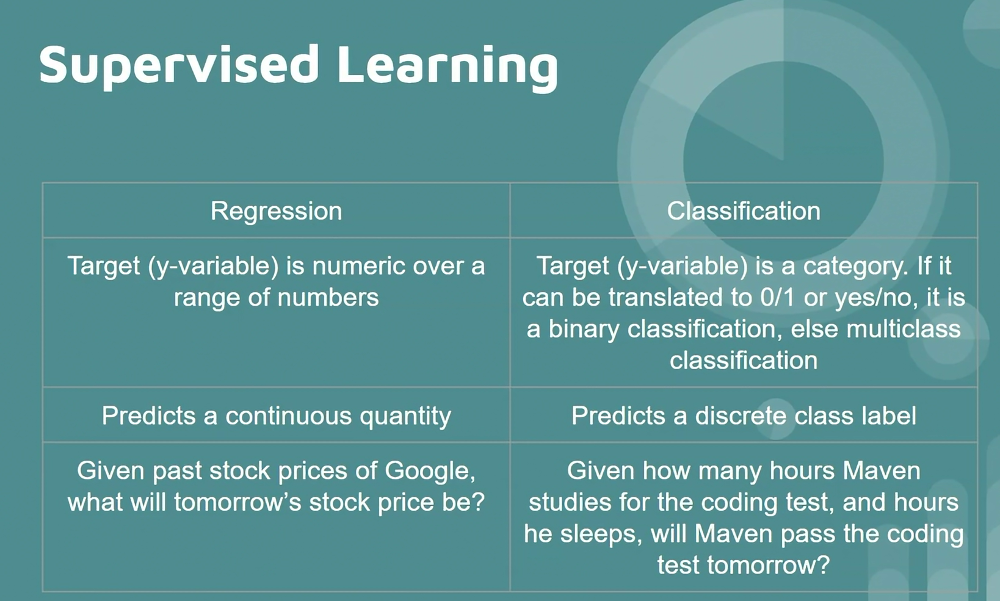

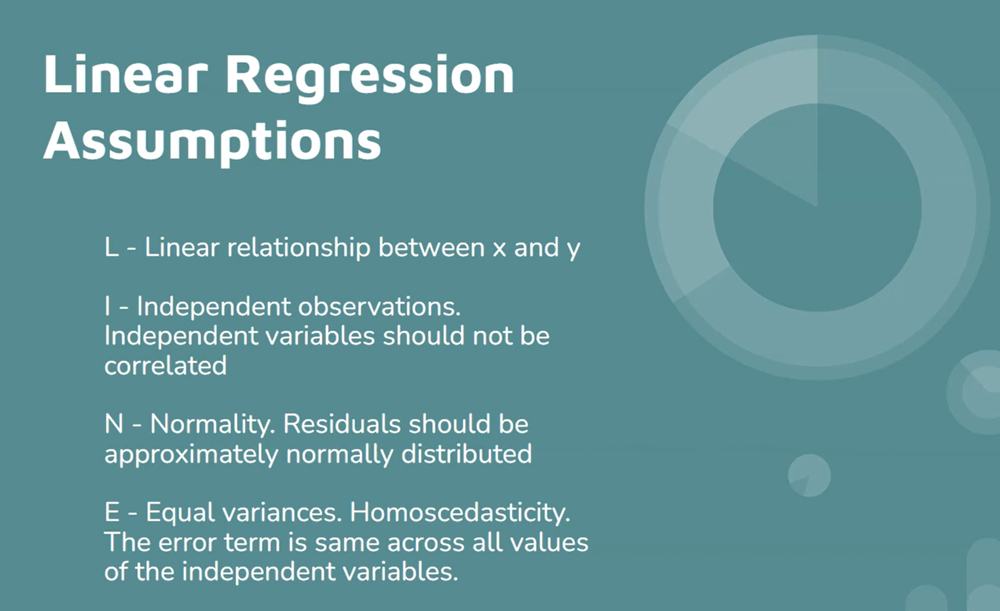

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

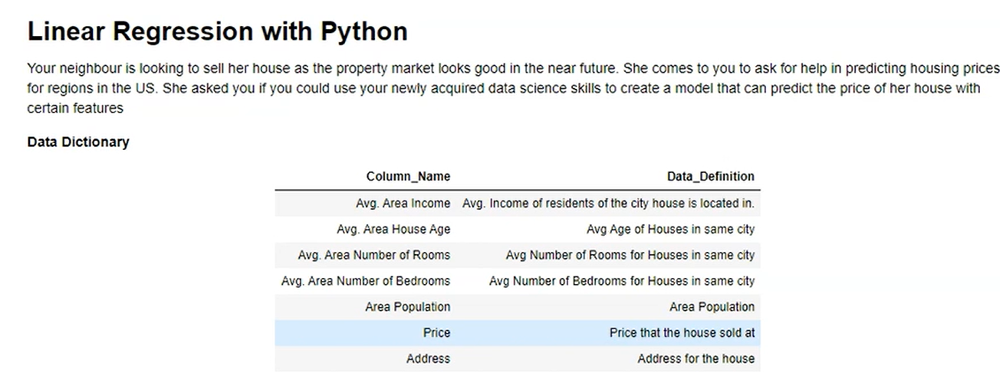

In [2]:
df = pd.read_csv('USA_Housing (1).csv')
df.head()

,Avg. Area Income,Avg. Area House Age,Avg. Area Number of Rooms,Avg. Area Number of Bedrooms,Area Population,Price,Address
0,79545.458574,5.682861,7.009188,4.09,23086.800503,1.059034e+06,"208 Michael Ferry Apt. 674\nLaurabury, NE 3701..."
1,79248.642455,6.002900,6.730821,3.09,40173.072174,1.505891e+06,"188 Johnson Views Suite 079\nLake Kathleen, CA..."
2,61287.067179,5.865890,8.512727,5.13,36882.159400,1.058988e+06,"9127 Elizabeth Stravenue\nDanieltown, WI 06482..."
3,63345.240046,7.188236,5.586729,3.26,34310.242831,1.260617e+06,USS Barnett\nFPO AP 44820
4,59982.197226,5.040555,7.839388,4.23,26354.109472,6.309435e+05,USNS Raymond\nFPO AE 09386


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Avg. Area Income              5000 non-null   float64
 1   Avg. Area House Age           5000 non-null   float64
 2   Avg. Area Number of Rooms     5000 non-null   float64
 3   Avg. Area Number of Bedrooms  5000 non-null   float64
 4   Area Population               5000 non-null   float64
 5   Price                         5000 non-null   float64
 6   Address                       5000 non-null   object 
dtypes: float64(6), object(1)
memory usage: 273.6+ KB


In [4]:
df.isnull().sum()

Avg. Area Income                0
Avg. Area House Age             0
Avg. Area Number of Rooms       0
Avg. Area Number of Bedrooms    0
Area Population                 0
Price                           0
Address                         0
dtype: int64

In [5]:
df.columns.to_list()

['Avg. Area Income',
 'Avg. Area House Age',
 'Avg. Area Number of Rooms',
 'Avg. Area Number of Bedrooms',
 'Area Population',
 'Price',
 'Address']

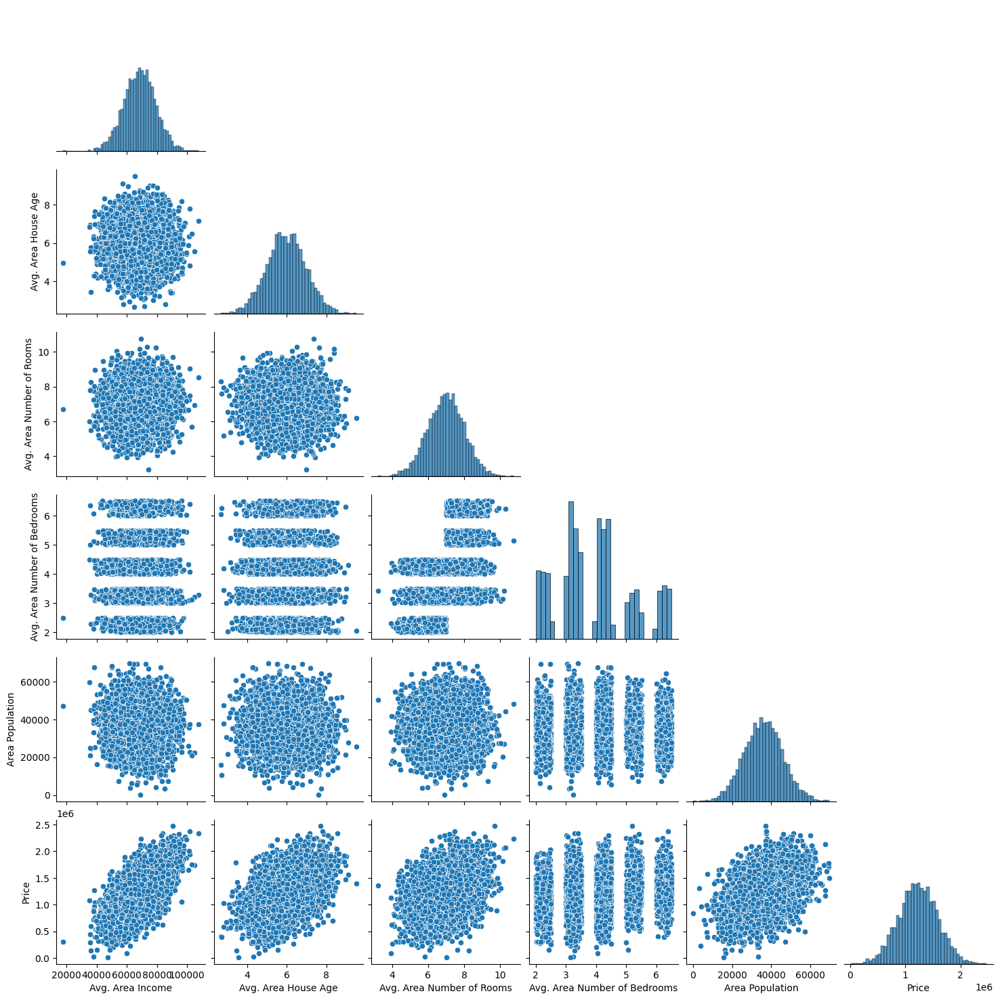

In [6]:
sns.pairplot(df, corner=True)

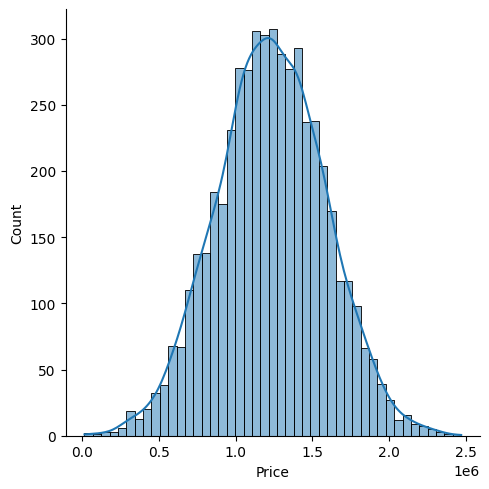

In [7]:
sns.displot(x='Price', data=df, kde=True)

In [8]:
df_no_address = df.drop(['Address'], axis=1)

Text(0.5, 1.0, 'Triangle Correlation Heatmap')

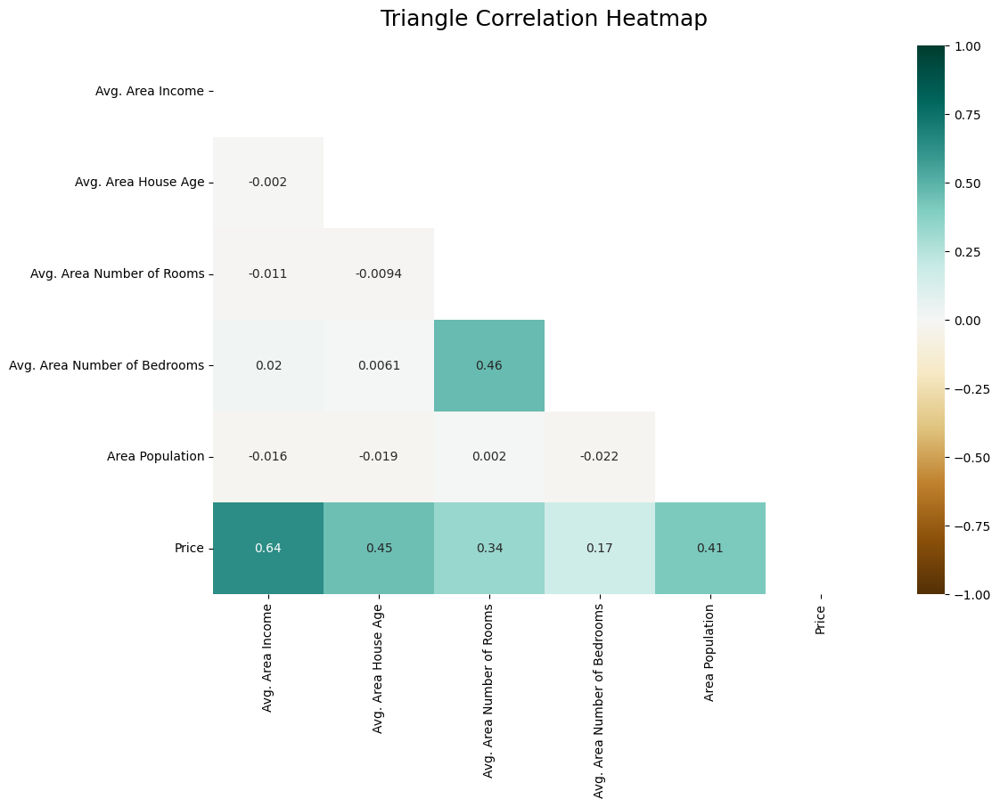

In [9]:
plt.figure(figsize=(12,8))
mask = np.triu(np.ones_like(df_no_address.corr(), dtype=bool))
heatmap = sns.heatmap(df_no_address.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':18}, pad=16)

If the x cols is correlated by value above 0.80 or 0.85. You might want to consider droping the cols, to prevent multicollinearity.
Intinya dalam 1 baris terdapat nilai col dari variable yang berbeda memiliki nilai yg sama 0.80 atau 0.85.

<Axes: >

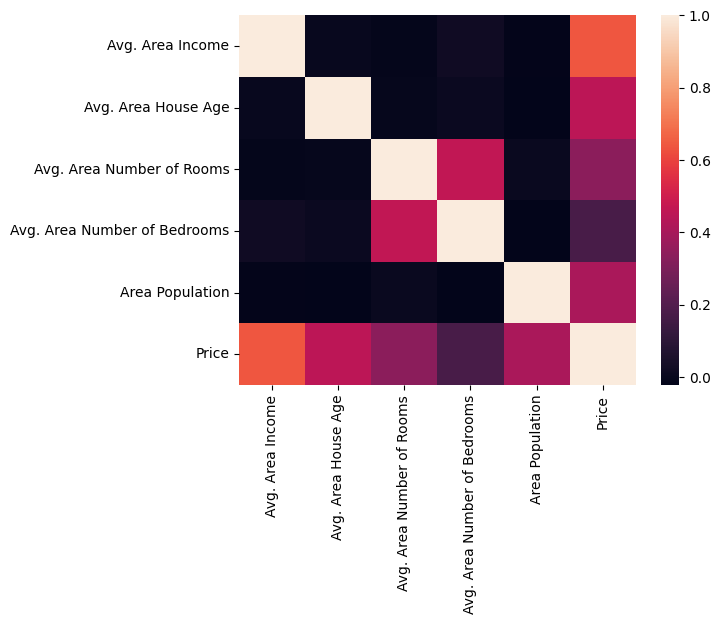

In [10]:
sns.heatmap(df_no_address.corr())

ML

Prepare The Data

In [11]:
X = df[['Avg. Area Income', 'Avg. Area House Age', 'Avg. Area Number of Rooms',
       'Avg. Area Number of Bedrooms', 'Area Population']]
y = df['Price']

In [ ]:
X

Data Split

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Create The Model

In [14]:
from sklearn.linear_model import LinearRegression

In [15]:
lr = LinearRegression()

In [16]:
lr.fit(X_train, y_train)

LinearRegression()

Model Evlauation

In [17]:
lr.score(X_test, y_test)

0.9146818498754001

In [18]:
lr.intercept_

-2638673.4261913276

In [19]:
pd.DataFrame(lr.coef_, X.columns, columns=['Coefficient'])

,Coefficient
Avg. Area Income,21.625799
Avg. Area House Age,165590.392746
Avg. Area Number of Rooms,119827.783390
Avg. Area Number of Bedrooms,2361.095262
Area Population,15.216581


Predicitions

In [20]:
predict = lr.predict(X_test)

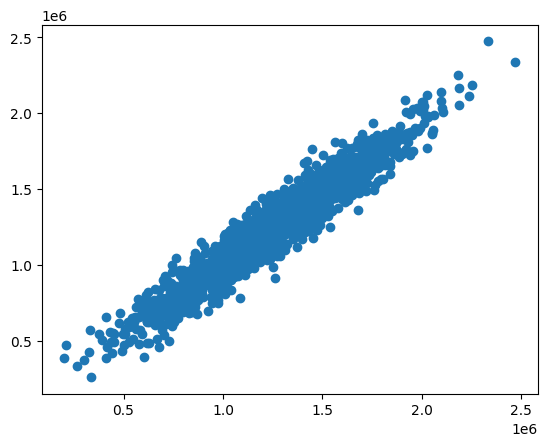

In [21]:
plt.scatter(y_test, predict)

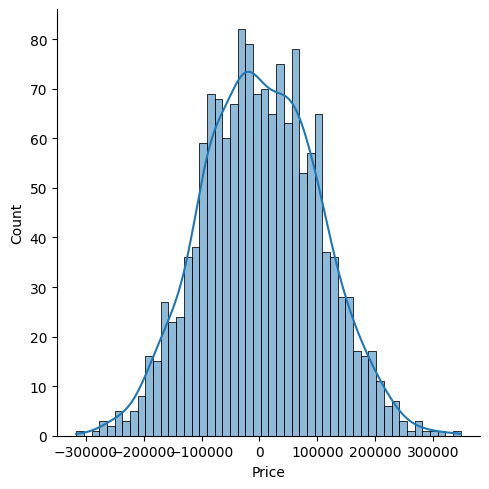

In [22]:
sns.displot((y_test-predict), bins=50, kde=True)

Metrics

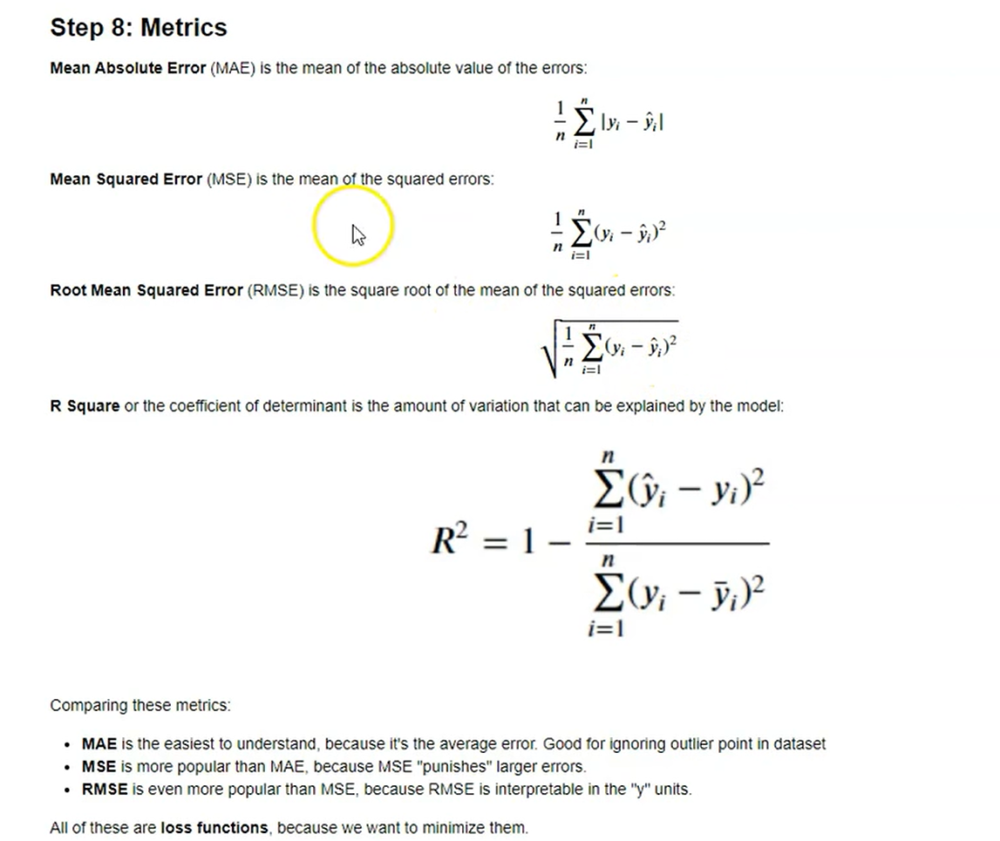

In [23]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [24]:
print('MAE', mean_absolute_error(y_test, predict))
print('MSE', mean_squared_error(y_test, predict))
print('RMSE', np.sqrt(mean_squared_error(y_test, predict)))
print('R_squared', r2_score(y_test, predict))

MAE 81135.56609336863
MSE 10068422551.401058
RMSE 100341.52954485525
R_squared 0.9146818498754001


In [25]:
from sklearn.model_selection import cross_val_score, cross_val_predict

In [26]:
lr.score(X_test, y_test)

0.9146818498754001

In [27]:
cross_val_score(lr, X_test, y_test, cv=3)

array([0.91795726, 0.91776799, 0.9052688 ])

In [28]:
cross_val_score(lr, X_test, y_test, cv=3).mean()

0.9136646843858977

In [29]:
cross_val_predict(lr, X_test, y_test, cv=3)

array([1310389.19902556, 1239287.02860134, 1246724.23865097, ...,
       1466046.80608568, 1480539.6737201 , 1059669.3594982 ])

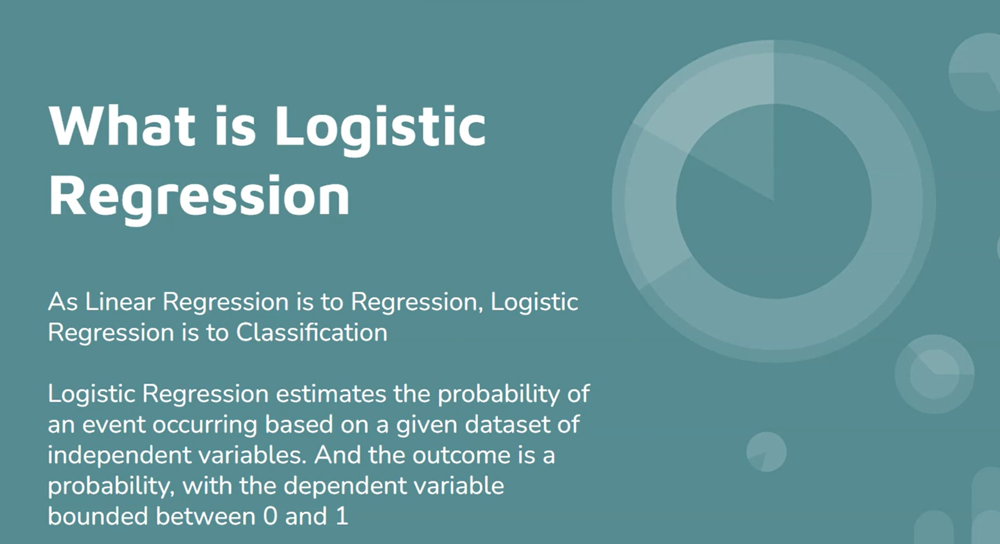

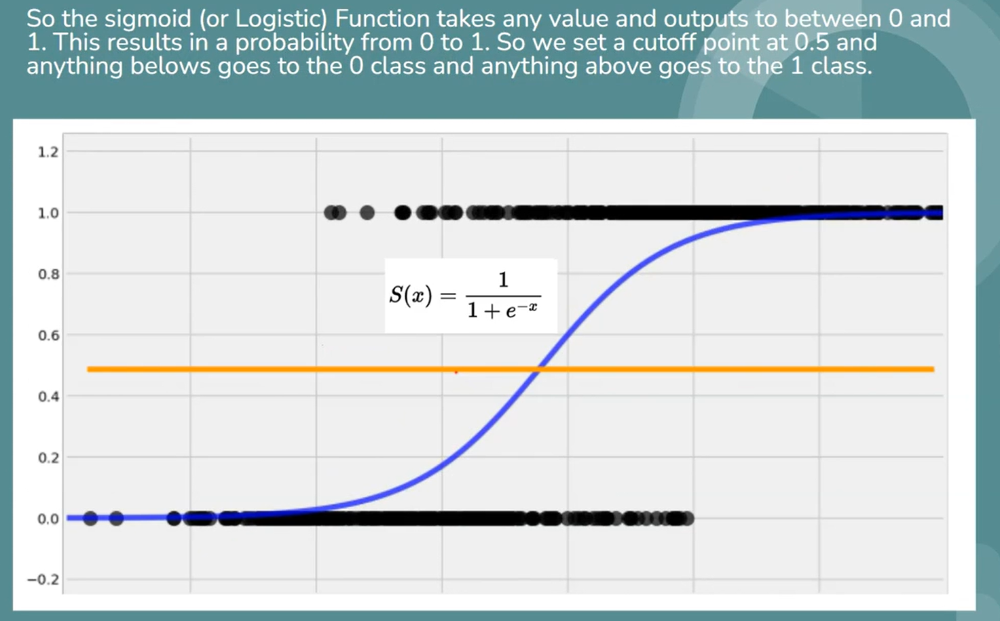

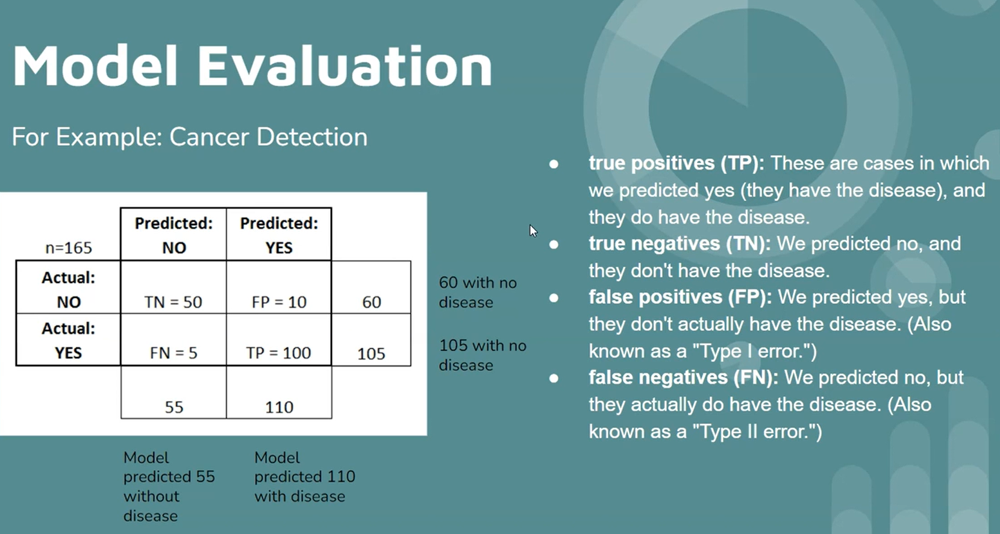

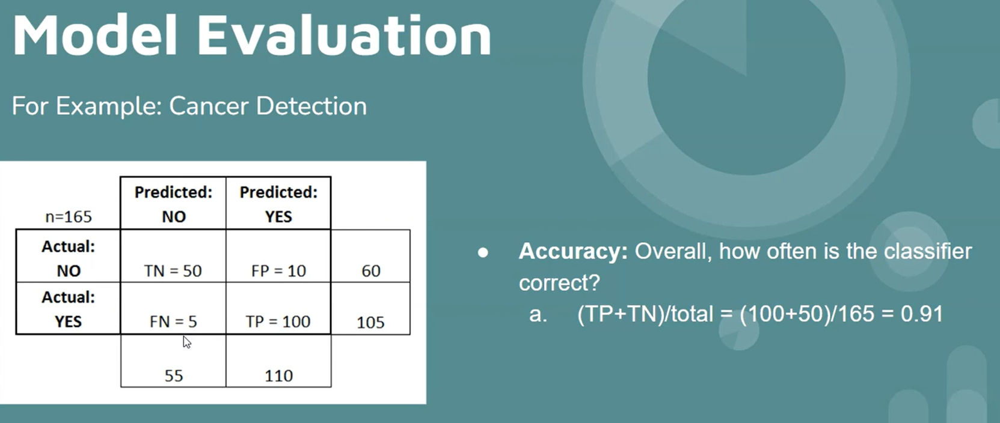

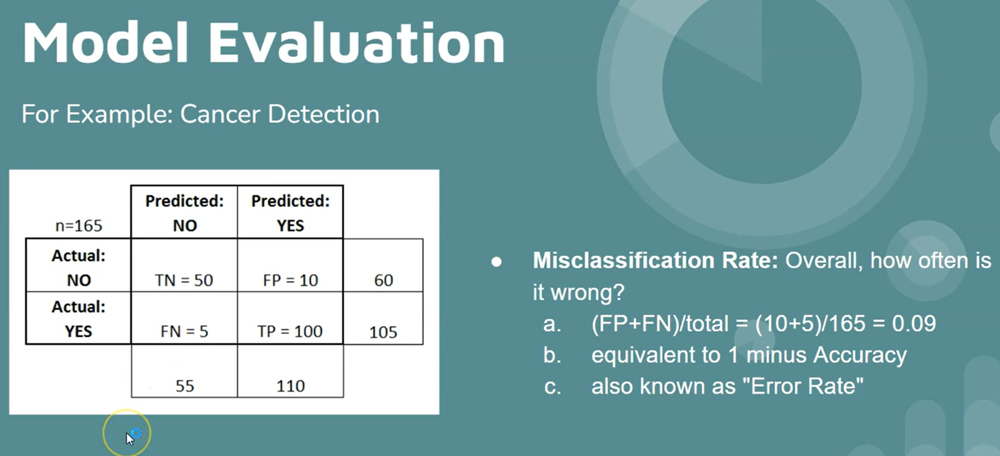

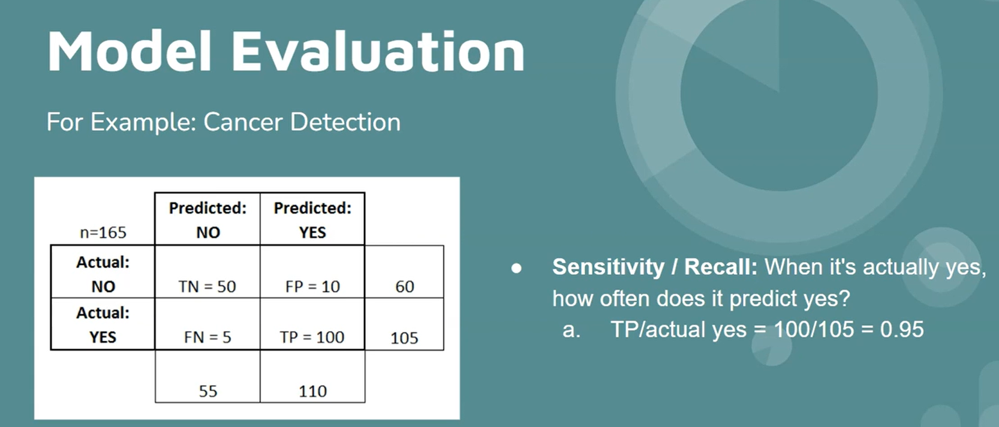

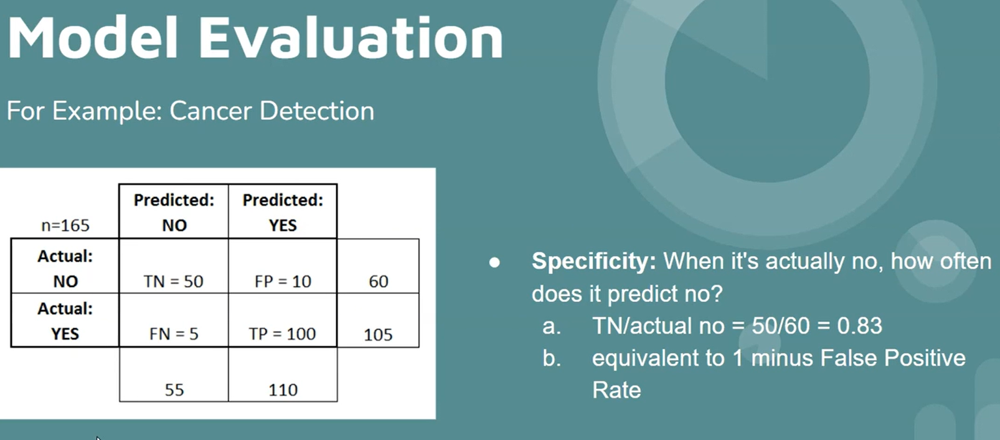

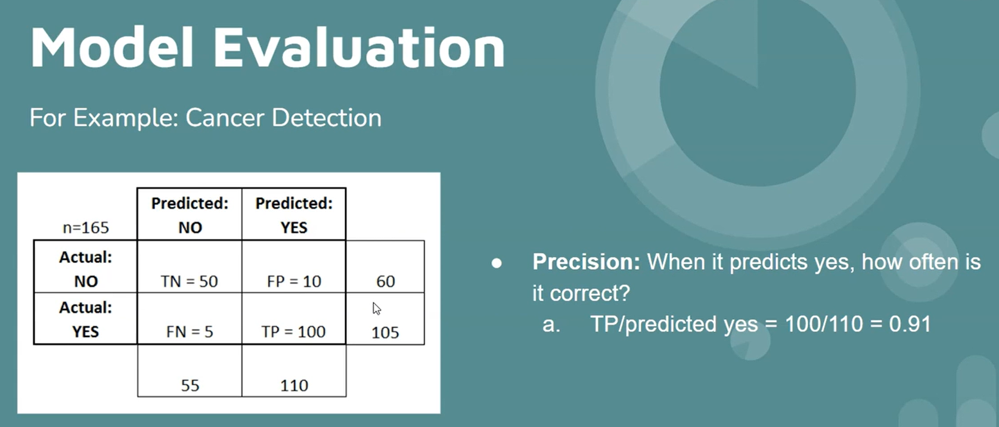

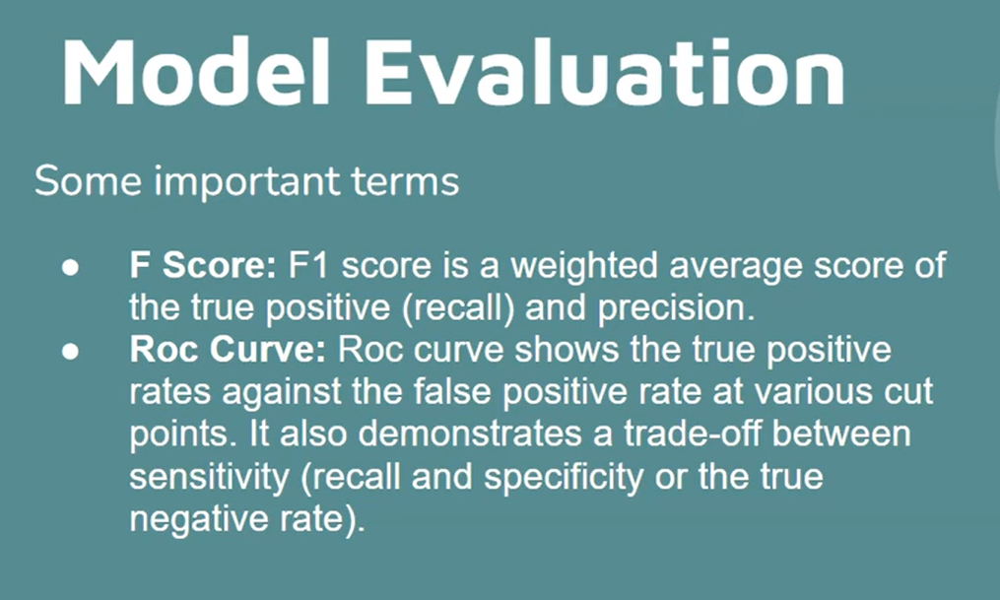

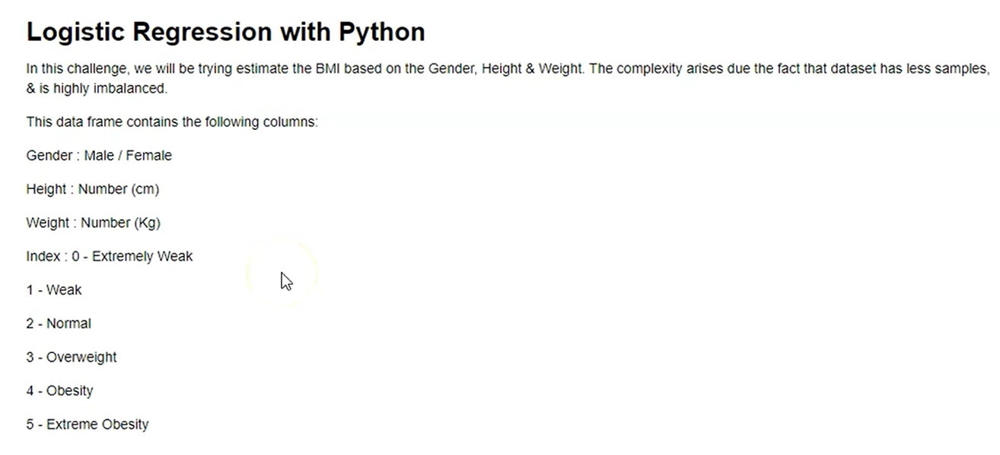

Get Data

In [30]:
df_LogReg = pd.read_csv('bmi.csv')
df_LogReg.head()

,Gender,Height,Weight,Index
0,Male,174,96,4
1,Male,189,87,2
2,Female,185,110,4
3,Female,195,104,3
4,Male,149,61,3


In [31]:
df_LogReg.isnull().sum()

Gender    0
Height    0
Weight    0
Index     0
dtype: int64

In [32]:
df_LogReg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Gender  500 non-null    object
 1   Height  500 non-null    int64 
 2   Weight  500 non-null    int64 
 3   Index   500 non-null    int64 
dtypes: int64(3), object(1)
memory usage: 15.8+ KB


In [33]:
df_LogReg['Index'].value_counts()

Index
5    198
4    130
2     69
3     68
1     22
0     13
Name: count, dtype: int64

In [34]:
df_LogReg[df_LogReg.duplicated(keep=False)]

,Gender,Height,Weight,Index
3,Female,195,104,3
8,Male,174,90,3
72,Male,141,80,5
138,Male,171,147,5
141,Female,167,85,4
156,Female,182,84,3
181,Male,177,117,4
187,Female,182,84,3
217,Female,142,86,5
242,Male,191,62,1


In [35]:
for index in df_LogReg[df_LogReg.duplicated()].index:
    df_LogReg.drop(index, inplace=True)

In [36]:
df_LogReg.reset_index(drop=True, inplace=True)

EDA

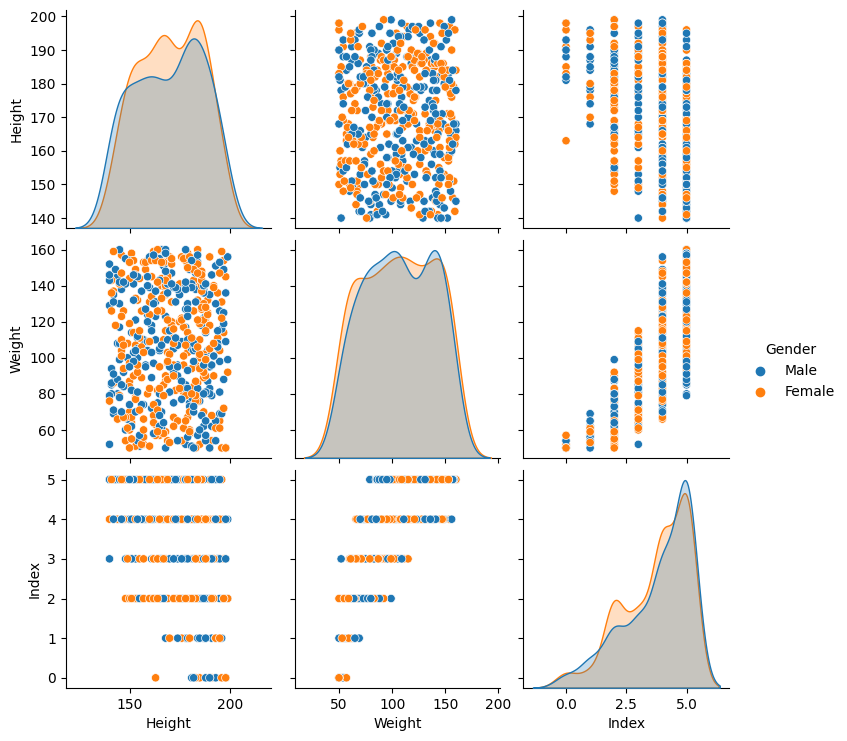

In [37]:
sns.pairplot(df_LogReg, hue='Gender')

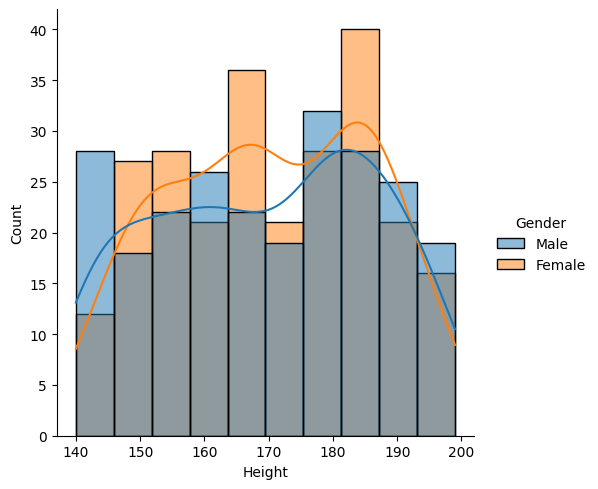

In [38]:
sns.displot(x='Height', hue='Gender', data=df_LogReg, kde=True)

<Figure size 1200x800 with 0 Axes>

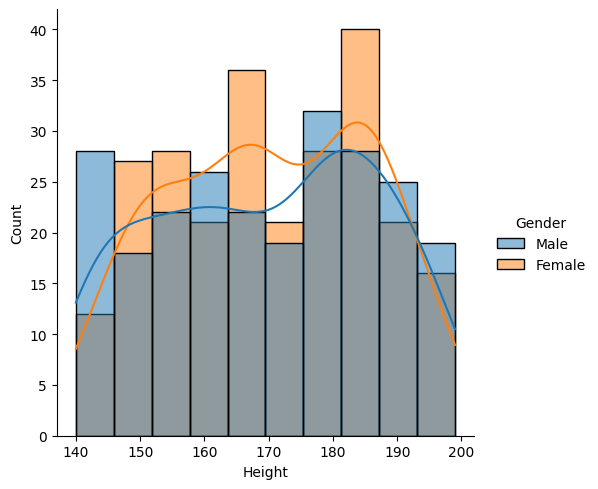

<Figure size 1200x800 with 0 Axes>

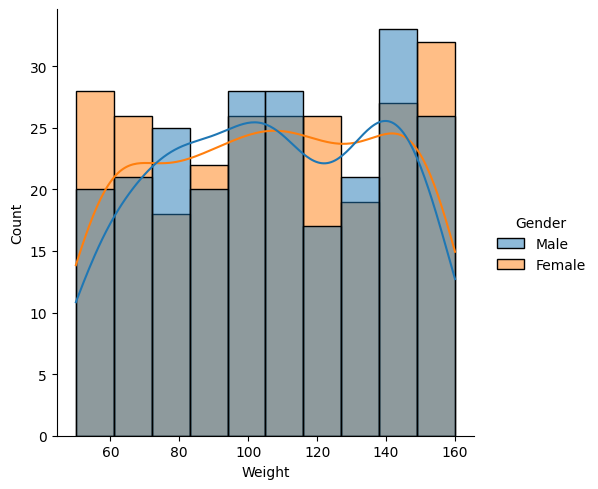

<Figure size 1200x800 with 0 Axes>

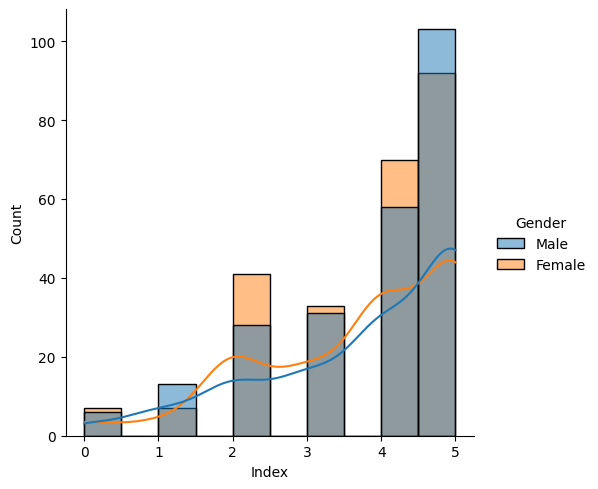

In [39]:
for data in df_LogReg.columns:
    if data != 'Gender':
        plt.figure(figsize=(12,8))
        sns.displot(x=data, hue='Gender', data=df_LogReg, kde=True)

<Figure size 1200x800 with 0 Axes>

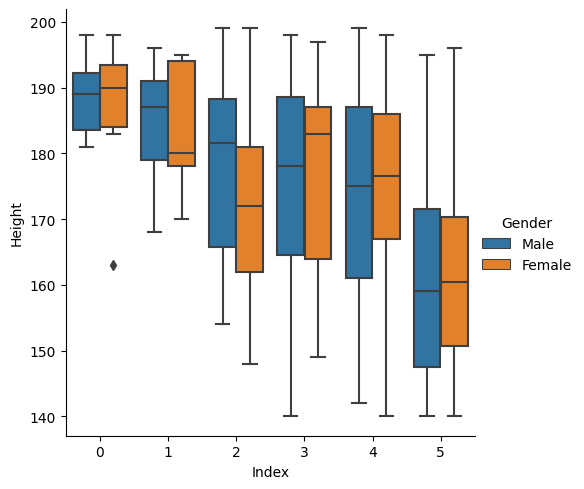

In [40]:
plt.figure(figsize=(12,8))
sns.catplot(x='Index', y='Height', hue='Gender', kind='box', data=df_LogReg)

<Figure size 1200x800 with 0 Axes>

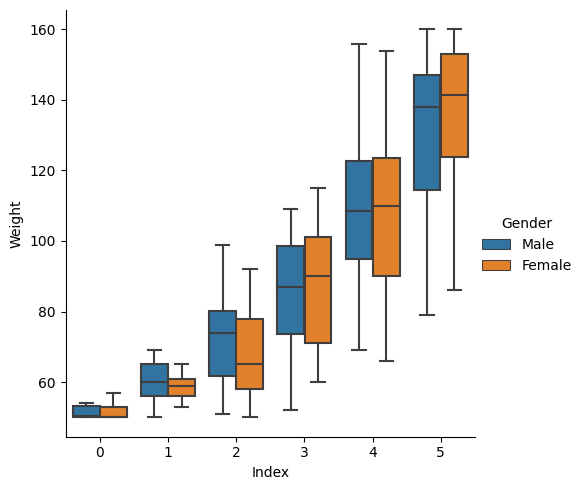

In [41]:
plt.figure(figsize=(12,8))
sns.catplot(x='Index', y='Weight', hue='Gender', kind='box', data=df_LogReg)

<Axes: xlabel='Index', ylabel='Weight'>

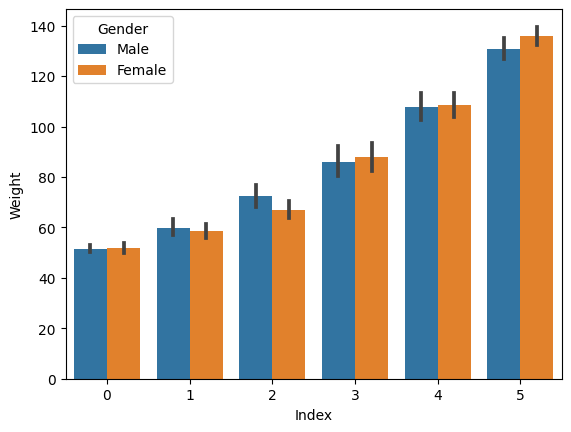

In [42]:
sns.barplot(x='Index', y='Weight', hue='Gender', data=df_LogReg)

<Axes: xlabel='Index', ylabel='count'>

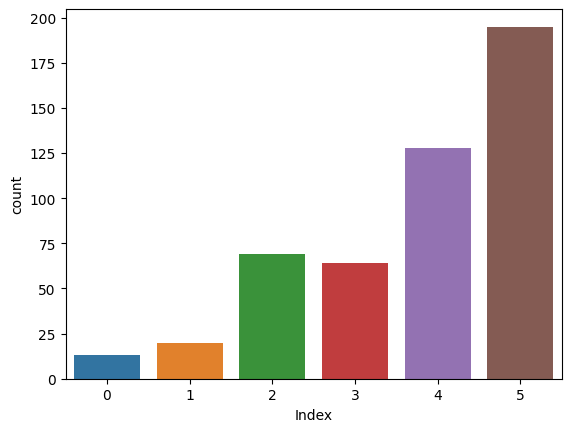

In [43]:
sns.countplot(x='Index', data=df_LogReg)

Feature Engineering

In [44]:
df_LogReg['Index'] = df_LogReg['Index'].map({
    0:0,
    1:0,
    2:0,
    3:1,
    4:1,
    5:1
})

In [45]:
gender = pd.get_dummies(df_LogReg['Gender'], drop_first=True)

In [53]:
gender

,Male
0,True
1,True
2,False
3,False
4,True
...,...
484,False
485,False
486,False
487,True


In [46]:
df_LogReg.head()

,Gender,Height,Weight,Index
0,Male,174,96,1
1,Male,189,87,0
2,Female,185,110,1
3,Female,195,104,1
4,Male,149,61,1


In [47]:
df_LogReg = pd.concat([df_LogReg, gender], axis=1)

In [48]:
df_LogReg.drop(columns=['Gender'], inplace=True)

In [49]:
df_LogReg.head()

,Height,Weight,Index,Male
0,174,96,1,True
1,189,87,0,True
2,185,110,1,False
3,195,104,1,False
4,149,61,1,True


Modeling and Training

In [54]:
from sklearn.linear_model import LogisticRegression

In [55]:
df_LogReg['Index'].value_counts(normalize=True)

Index
1    0.791411
0    0.208589
Name: proportion, dtype: float64

In [56]:
X = df_LogReg[['Male', 'Weight', 'Height']]
y = df_LogReg['Index']

In [57]:
X_train, X_test, y_train, y_test = train_test_split(X,y , test_size=0.33, random_state=42)

In [59]:
log = LogisticRegression()
log.fit(X_train, y_train)

LogisticRegression()

In [60]:
log.score(X_train, y_train)

0.9694189602446484

In [61]:
log.score(X_test, y_test)

0.9814814814814815

Interpretations and Predictions

In [64]:
pd.DataFrame(log.coef_[0], X.columns)

,0
Male,0.465441
Weight,0.309205
Height,-0.260087


In [65]:
log.predict_proba(X_test)

array([[2.41634574e-06, 9.99997584e-01],
       [1.38249264e-07, 9.99999862e-01],
       [1.75726100e-12, 1.00000000e+00],
       [5.73482148e-05, 9.99942652e-01],
       [2.41101583e-10, 1.00000000e+00],
       [9.99305914e-01, 6.94086341e-04],
       [5.18705567e-09, 9.99999995e-01],
       [6.61734775e-08, 9.99999934e-01],
       [9.98926535e-01, 1.07346524e-03],
       [5.67884624e-01, 4.32115376e-01],
       [1.38490526e-04, 9.99861509e-01],
       [5.27000665e-12, 1.00000000e+00],
       [4.12248014e-12, 1.00000000e+00],
       [1.39273237e-04, 9.99860727e-01],
       [1.80206228e-09, 9.99999998e-01],
       [9.54030755e-01, 4.59692454e-02],
       [1.22548638e-11, 1.00000000e+00],
       [5.42775040e-06, 9.99994572e-01],
       [3.00295082e-02, 9.69970492e-01],
       [3.62998520e-12, 1.00000000e+00],
       [2.40281886e-06, 9.99997597e-01],
       [9.18258325e-06, 9.99990817e-01],
       [7.01479423e-07, 9.99999299e-01],
       [5.31425999e-01, 4.68574001e-01],
       [2.255425

In [66]:
log.predict(X_test)

array([1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1], dtype=int64)

Evaluation

In [74]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import RocCurveDisplay

In [67]:
predictions = log.predict(X_test)

In [69]:
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96        39
           1       1.00      0.98      0.99       123

    accuracy                           0.98       162
   macro avg       0.96      0.99      0.98       162
weighted avg       0.98      0.98      0.98       162



<Axes: >

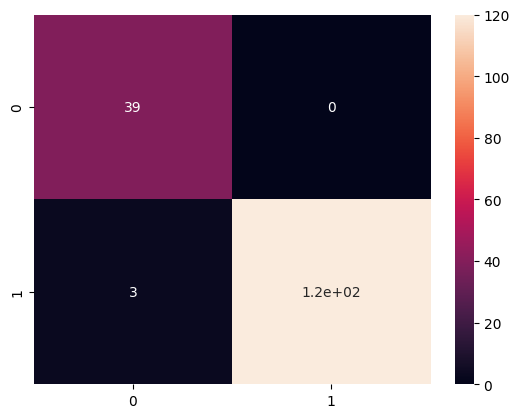

In [72]:
sns.heatmap(confusion_matrix(y_test, predictions), annot=True)

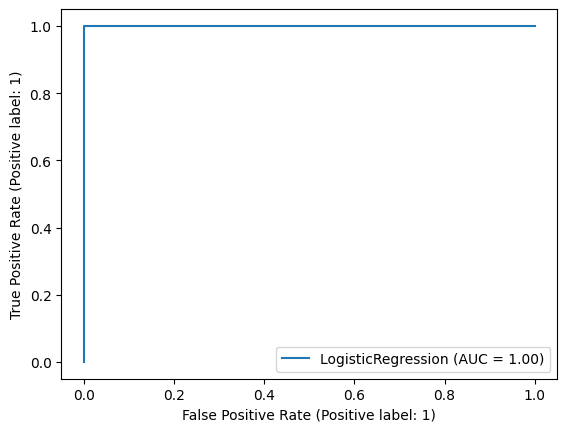

In [77]:
RocCurveDisplay.from_estimator(log, X_test, y_test)

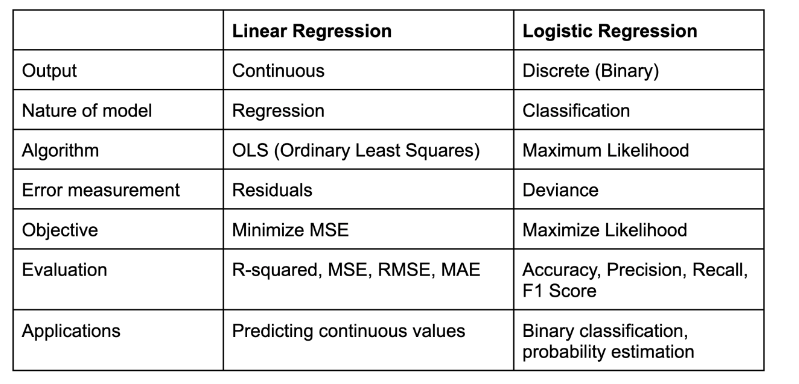